In [1]:
import openslide
import numpy as np
import matplotlib.pyplot as plt

Level count: 6
Level dimensions: ((272128, 294144), (68032, 73536), (17008, 18384), (4252, 4596), (1063, 1149), (265, 287))


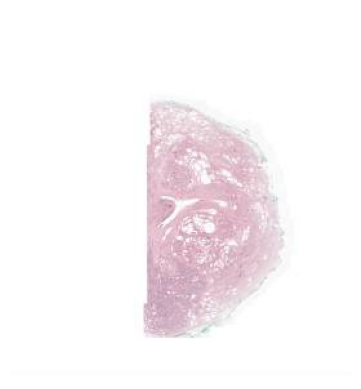

In [2]:
slide = openslide.OpenSlide('/data04/shared/xxu/cvpr/chime/data/task1/pathology/1003/1003_2.tif')

# 查看图像的层级和尺寸
print("Level count:", slide.level_count)
print("Level dimensions:", slide.level_dimensions)

# 读取某个层级的图像（比如最低分辨率层）
level = slide.level_count - 1  # 最低分辨率
thumbnail = slide.read_region((0, 0), level, slide.level_dimensions[level])

# 转换为 numpy 数组并可视化
img_np = np.array(thumbnail)[:, :, :3]  # 去掉 alpha 通道
plt.imshow(img_np)
plt.axis('off')
plt.show()

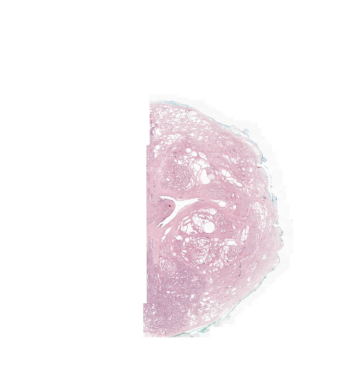

In [3]:
level = slide.level_count - 2  # 最低分辨率
thumbnail = slide.read_region((0, 0), level, slide.level_dimensions[level])

# 转换为 numpy 数组并可视化
img_np = np.array(thumbnail)[:, :, :3]  # 去掉 alpha 通道
plt.imshow(img_np)
plt.axis('off')
plt.show()

In [9]:
thumbnail.size

(1063, 1149)

In [10]:
img_np.shape

(1149, 1063, 3)

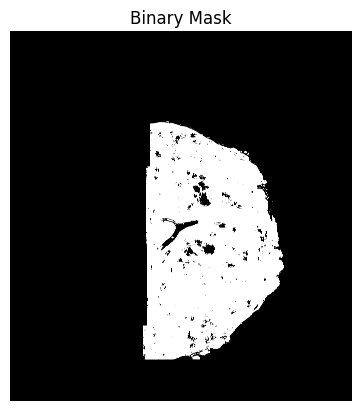

In [5]:
from tifffile import imread
import matplotlib.pyplot as plt

# 读取 binary mask（单通道或 RGB）
mask = imread('/data04/shared/xxu/cvpr/chime/data/task1/pathology/1003/1003_2_mask.tif')  # shape: (H, W) or (H, W, C)

# 如果是 RGB，取某个通道或做二值化
if mask.ndim == 3:
    mask = mask[:, :, 0]  # 或做 threshold: mask = (mask[:, :, 0] > 128).astype(np.uint8)

# 可视化
plt.imshow(mask, cmap='gray')
plt.title("Binary Mask")
plt.axis('off')
plt.show()


In [17]:
mask.shape

(36768, 34016)

In [18]:
np.unique(mask)

array([0, 1], dtype=uint8)

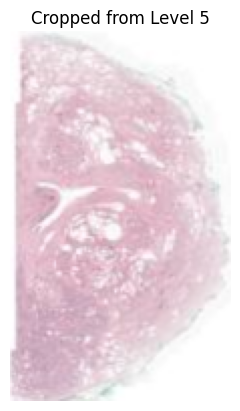

In [29]:
import numpy as np
import openslide
import matplotlib.pyplot as plt
from tifffile import imread

# 1. 读取 slide 和 mask
slide = openslide.OpenSlide('/data04/shared/xxu/cvpr/chime/data/task1/pathology/1003/1003_2.tif')
mask = imread('/data04/shared/xxu/cvpr/chime/data/task1/pathology/1003/1003_2_mask.tif')

# 如果是 RGB mask，转灰度
if mask.ndim == 3:
    mask = mask[:, :, 0]

# 2. 计算 mask 中前景区域的 bounding box
ys, xs = np.where(mask > 0)
y_min, y_max = ys.min(), ys.max()
x_min, x_max = xs.min(), xs.max()

# 3. 获取 slide level 0 大小（原始分辨率）
level_0_dim = slide.level_dimensions[0]
slide_width_0, slide_height_0 = level_0_dim  # (272128, 294144)
mask_width, mask_height = mask.shape[1], mask.shape[0]

# 4. 计算 mask → level 0 的缩放比例
scale_x_0 = slide_width_0 / mask_width
scale_y_0 = slide_height_0 / mask_height

# 5. 将 bbox 映射到 slide level 0 坐标
x0 = int(x_min * scale_x_0)
y0 = int(y_min * scale_y_0)
w0 = int((x_max - x_min) * scale_x_0)
h0 = int((y_max - y_min) * scale_y_0)

# 6. 选择最低分辨率的 level
target_level = slide.level_count - 1
target_level_dims = slide.level_dimensions[target_level]
scale_x_level = level_0_dim[0] / target_level_dims[0]
scale_y_level = level_0_dim[1] / target_level_dims[1]

# 7. 将 level 0 的坐标映射到当前 level 坐标
x_level = int(x0 / scale_x_level)
y_level = int(y0 / scale_y_level)
w_level = int(w0 / scale_x_level)
h_level = int(h0 / scale_y_level)

# 8. 读取该 level 中对应区域
region = slide.read_region((x0, y0), target_level, (w_level, h_level)).convert("RGB")

# 9. 可视化
plt.imshow(region)
plt.title(f"Cropped from Level {target_level}")
plt.axis('off')
plt.show()


In [33]:
for i in range(1,4):
    target_level = slide.level_count - i
    target_level_dims = slide.level_dimensions[target_level]
    scale_x_level = level_0_dim[0] / target_level_dims[0]
    scale_y_level = level_0_dim[1] / target_level_dims[1]

    # 7. 将 level 0 的坐标映射到当前 level 坐标
    x_level = int(x0 / scale_x_level)
    y_level = int(y0 / scale_y_level)
    w_level = int(w0 / scale_x_level)
    h_level = int(h0 / scale_y_level)

    # 8. 读取该 level 中对应区域
    region = slide.read_region((x0, y0), target_level, (w_level, h_level)).convert("RGB")
    save_path = '/data04/shared/xxu/cvpr/chime/data/task1_processed/pathology/1003/1003_2_'+str(target_level)+'.png'
    region.save(save_path)

# # 9. 可视化
# plt.imshow(region)
# plt.title(f"Cropped from Level {target_level}")
# plt.axis('off')
# plt.show()

In [2]:
import glob,os
slide_list = glob.glob('/data04/shared/xxu/cvpr/chime/data/task1/pathology/*/')
slide_list.sort()
print(len(slide_list))

56


In [13]:
from tqdm import tqdm
import numpy as np
import openslide
import matplotlib.pyplot as plt
from tifffile import imread
for cnt in tqdm(range(len(slide_list))):
    slide_cnt = slide_list[cnt].split('/')[-2]
    save_folder = os.path.join('/data04/shared/xxu/cvpr/chime/data/task1_processed/pathology',slide_cnt)
    os.makedirs(save_folder, exist_ok=True)
    mask_paths = glob.glob(slide_list[cnt]+'*mask.tif')
    mask_paths.sort()
    for mask_item in mask_paths:
        slide_item = mask_item.replace('_mask','')
        print('slide path:{} mask path:{}'.format(slide_item,mask_item))
        slide = openslide.OpenSlide(slide_item)
        mask = imread(mask_item)

        # 如果是 RGB mask，转灰度
        if mask.ndim == 3:
            mask = mask[:, :, 0]

        # 2. 计算 mask 中前景区域的 bounding box
        ys, xs = np.where(mask > 0)
        y_min, y_max = ys.min(), ys.max()
        x_min, x_max = xs.min(), xs.max()

        # 3. 获取 slide level 0 大小（原始分辨率）
        level_0_dim = slide.level_dimensions[0]
        slide_width_0, slide_height_0 = level_0_dim  # (272128, 294144)
        mask_width, mask_height = mask.shape[1], mask.shape[0]

        # 4. 计算 mask → level 0 的缩放比例
        scale_x_0 = slide_width_0 / mask_width
        scale_y_0 = slide_height_0 / mask_height

        # 5. 将 bbox 映射到 slide level 0 坐标
        x0 = int(x_min * scale_x_0)
        y0 = int(y_min * scale_y_0)
        w0 = int((x_max - x_min) * scale_x_0)
        h0 = int((y_max - y_min) * scale_y_0)

        for i in range(1,4):
            target_level = slide.level_count - i
            target_level_dims = slide.level_dimensions[target_level]
            scale_x_level = level_0_dim[0] / target_level_dims[0]
            scale_y_level = level_0_dim[1] / target_level_dims[1]

            # 7. 将 level 0 的坐标映射到当前 level 坐标
            x_level = int(x0 / scale_x_level)
            y_level = int(y0 / scale_y_level)
            w_level = int(w0 / scale_x_level)
            h_level = int(h0 / scale_y_level)

            # 8. 读取该 level 中对应区域
            region = slide.read_region((x0, y0), target_level, (w_level, h_level)).convert("RGB")
            save_path = os.path.join(save_folder,slide_item.split('/')[-1].split('.')[0]+'_level_'+str(target_level)+'.png')
            region.save(save_path)

  0%|          | 0/56 [00:00<?, ?it/s]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1003/1003_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1003/1003_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1003/1003_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1003/1003_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1003/1003_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1003/1003_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1003/1003_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1003/1003_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1003/1003_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1003/1003_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1003/1003_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1003/1003_6_mask.tif


  2%|▏         | 1/56 [02:43<2:30:04, 163.71s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1010/1010_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1010/1010_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1010/1010_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1010/1010_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1010/1010_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1010/1010_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1010/1010_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1010/1010_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1010/1010_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1010/1010_5_mask.tif


  4%|▎         | 2/56 [03:56<1:39:04, 110.08s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1011/1011_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1011/1011_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1011/1011_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1011/1011_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1011/1011_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1011/1011_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1011/1011_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1011/1011_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1011/1011_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1011/1011_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1011/1011_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1011/1011_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

  5%|▌         | 3/56 [06:16<1:49:13, 123.66s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1021/1021_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1021/1021_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1021/1021_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1021/1021_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1021/1021_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1021/1021_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1021/1021_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1021/1021_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1021/1021_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1021/1021_5_mask.tif


  7%|▋         | 4/56 [06:39<1:12:46, 83.97s/it] 

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1025/1025_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1025/1025_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1025/1025_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1025/1025_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1025/1025_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1025/1025_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1025/1025_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1025/1025_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1025/1025_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1025/1025_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1025/1025_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1025/1025_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

  9%|▉         | 5/56 [09:31<1:38:25, 115.80s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1026/1026_10.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1026/1026_10_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1026/1026_11.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1026/1026_11_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1026/1026_12.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1026/1026_12_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1026/1026_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1026/1026_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1026/1026_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1026/1026_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1026/1026_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1026/1026_3_mask.tif
slide path:/data04/shared/xxu/cvpr

 11%|█         | 6/56 [10:35<1:21:49, 98.19s/it] 

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1028/1028_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1028/1028_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1028/1028_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1028/1028_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1028/1028_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1028/1028_3_mask.tif


 12%|█▎        | 7/56 [10:49<57:36, 70.54s/it]  

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1030/1030_10.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1030/1030_10_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1030/1030_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1030/1030_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1030/1030_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1030/1030_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1030/1030_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1030/1030_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1030/1030_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1030/1030_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1030/1030_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1030/1030_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chi

 14%|█▍        | 8/56 [13:06<1:13:31, 91.90s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1031/1031_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1031/1031_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1031/1031_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1031/1031_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1031/1031_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1031/1031_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1031/1031_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1031/1031_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1031/1031_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1031/1031_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1031/1031_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1031/1031_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 16%|█▌        | 9/56 [14:22<1:08:09, 87.00s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1035/1035_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1035/1035_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1035/1035_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1035/1035_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1035/1035_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1035/1035_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1035/1035_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1035/1035_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1035/1035_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1035/1035_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1035/1035_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1035/1035_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 18%|█▊        | 10/56 [15:36<1:03:25, 82.73s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1036/1036_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1036/1036_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1036/1036_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1036/1036_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1036/1036_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1036/1036_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1036/1036_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1036/1036_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1036/1036_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1036/1036_5_mask.tif


 20%|█▉        | 11/56 [15:58<48:15, 64.35s/it]  

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1037/1037_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1037/1037_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1037/1037_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1037/1037_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1037/1037_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1037/1037_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1037/1037_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1037/1037_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1037/1037_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1037/1037_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1037/1037_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1037/1037_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 21%|██▏       | 12/56 [16:33<40:32, 55.28s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1039/1039_10.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1039/1039_10_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1039/1039_11.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1039/1039_11_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1039/1039_12.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1039/1039_12_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1039/1039_13.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1039/1039_13_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1039/1039_14.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1039/1039_14_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1039/1039_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1039/1039_1_mask.tif
slide path:/data04/shared/xxu/

 23%|██▎       | 13/56 [17:31<40:17, 56.23s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1041/1041_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1041/1041_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1041/1041_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1041/1041_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1041/1041_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1041/1041_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1041/1041_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1041/1041_4_mask.tif


 25%|██▌       | 14/56 [19:41<54:50, 78.34s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1048/1048_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1048/1048_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1048/1048_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1048/1048_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1048/1048_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1048/1048_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1048/1048_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1048/1048_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1048/1048_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1048/1048_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1048/1048_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1048/1048_6_mask.tif


 27%|██▋       | 15/56 [20:12<43:48, 64.10s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1052/1052_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1052/1052_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1052/1052_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1052/1052_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1052/1052_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1052/1052_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1052/1052_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1052/1052_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1052/1052_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1052/1052_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1052/1052_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1052/1052_6_mask.tif


 29%|██▊       | 16/56 [21:01<39:47, 59.69s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1056/1056_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1056/1056_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1056/1056_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1056/1056_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1056/1056_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1056/1056_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1056/1056_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1056/1056_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1056/1056_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1056/1056_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1056/1056_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1056/1056_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 30%|███       | 17/56 [22:51<48:37, 74.82s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1060/1060_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1060/1060_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1060/1060_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1060/1060_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1060/1060_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1060/1060_3_mask.tif


 32%|███▏      | 18/56 [23:03<35:26, 55.97s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1062/1062_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1062/1062_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1062/1062_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1062/1062_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1062/1062_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1062/1062_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1062/1062_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1062/1062_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1062/1062_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1062/1062_5_mask.tif


 34%|███▍      | 19/56 [24:44<42:46, 69.36s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1064/1064_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1064/1064_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1064/1064_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1064/1064_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1064/1064_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1064/1064_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1064/1064_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1064/1064_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1064/1064_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1064/1064_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1064/1064_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1064/1064_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 36%|███▌      | 20/56 [25:21<35:53, 59.81s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1066/1066_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1066/1066_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1066/1066_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1066/1066_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1066/1066_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1066/1066_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1066/1066_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1066/1066_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1066/1066_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1066/1066_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1066/1066_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1066/1066_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 38%|███▊      | 21/56 [26:43<38:47, 66.50s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1068/1068_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1068/1068_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1068/1068_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1068/1068_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1068/1068_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1068/1068_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1068/1068_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1068/1068_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1068/1068_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1068/1068_5_mask.tif


 39%|███▉      | 22/56 [27:10<30:48, 54.37s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1071/1071_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1071/1071_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1071/1071_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1071/1071_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1071/1071_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1071/1071_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1071/1071_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1071/1071_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1071/1071_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1071/1071_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1071/1071_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1071/1071_6_mask.tif


 41%|████      | 23/56 [28:32<34:34, 62.87s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1086/1086_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1086/1086_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1086/1086_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1086/1086_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1086/1086_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1086/1086_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1086/1086_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1086/1086_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1086/1086_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1086/1086_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1086/1086_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1086/1086_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 43%|████▎     | 24/56 [33:14<1:08:35, 128.61s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1090/1090_10.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1090/1090_10_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1090/1090_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1090/1090_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1090/1090_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1090/1090_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1090/1090_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1090/1090_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1090/1090_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1090/1090_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1090/1090_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1090/1090_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chi

 45%|████▍     | 25/56 [33:58<53:14, 103.05s/it]  

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1094/1094_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1094/1094_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1094/1094_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1094/1094_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1094/1094_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1094/1094_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1094/1094_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1094/1094_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1094/1094_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1094/1094_5_mask.tif


 46%|████▋     | 26/56 [34:50<43:56, 87.89s/it] 

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1100/1100_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1100/1100_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1100/1100_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1100/1100_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1100/1100_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1100/1100_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1100/1100_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1100/1100_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1100/1100_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1100/1100_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1100/1100_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1100/1100_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 48%|████▊     | 27/56 [35:26<34:59, 72.40s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1106/1106_10.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1106/1106_10_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1106/1106_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1106/1106_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1106/1106_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1106/1106_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1106/1106_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1106/1106_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1106/1106_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1106/1106_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1106/1106_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1106/1106_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chi

 50%|█████     | 28/56 [38:08<46:18, 99.23s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1107/1107_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1107/1107_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1107/1107_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1107/1107_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1107/1107_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1107/1107_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1107/1107_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1107/1107_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1107/1107_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1107/1107_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1107/1107_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1107/1107_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 52%|█████▏    | 29/56 [39:17<40:29, 89.99s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1112/1112_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1112/1112_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1112/1112_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1112/1112_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1112/1112_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1112/1112_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1112/1112_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1112/1112_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1112/1112_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1112/1112_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1112/1112_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1112/1112_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 54%|█████▎    | 30/56 [39:51<31:46, 73.33s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1114/1114_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1114/1114_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1114/1114_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1114/1114_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1114/1114_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1114/1114_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1114/1114_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1114/1114_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1114/1114_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1114/1114_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1114/1114_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1114/1114_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 55%|█████▌    | 31/56 [40:23<25:20, 60.83s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1117/1117_10.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1117/1117_10_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1117/1117_11.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1117/1117_11_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1117/1117_12.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1117/1117_12_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1117/1117_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1117/1117_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1117/1117_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1117/1117_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1117/1117_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1117/1117_3_mask.tif
slide path:/data04/shared/xxu/cvpr

 57%|█████▋    | 32/56 [42:38<33:15, 83.14s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1120/1120_10.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1120/1120_10_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1120/1120_11.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1120/1120_11_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1120/1120_12.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1120/1120_12_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1120/1120_13.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1120/1120_13_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1120/1120_14.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1120/1120_14_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1120/1120_15.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1120/1120_15_mask.tif
slide path:/data04/shared/xx

 59%|█████▉    | 33/56 [44:30<35:09, 91.72s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1122/1122_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1122/1122_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1122/1122_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1122/1122_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1122/1122_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1122/1122_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1122/1122_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1122/1122_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1122/1122_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1122/1122_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1122/1122_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1122/1122_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 61%|██████    | 34/56 [45:30<30:11, 82.36s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1123/1123_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1123/1123_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1123/1123_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1123/1123_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1123/1123_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1123/1123_3_mask.tif


 62%|██████▎   | 35/56 [45:42<21:25, 61.19s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1127/1127_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1127/1127_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1127/1127_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1127/1127_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1127/1127_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1127/1127_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1127/1127_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1127/1127_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1127/1127_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1127/1127_5_mask.tif


 64%|██████▍   | 36/56 [46:55<21:35, 64.76s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1129/1129_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1129/1129_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1129/1129_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1129/1129_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1129/1129_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1129/1129_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1129/1129_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1129/1129_4_mask.tif


 66%|██████▌   | 37/56 [48:36<23:54, 75.49s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1130/1130_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1130/1130_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1130/1130_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1130/1130_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1130/1130_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1130/1130_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1130/1130_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1130/1130_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1130/1130_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1130/1130_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1130/1130_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1130/1130_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 68%|██████▊   | 38/56 [50:32<26:20, 87.79s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1135/1135_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1135/1135_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1135/1135_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1135/1135_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1135/1135_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1135/1135_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1135/1135_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1135/1135_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1135/1135_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1135/1135_5_mask.tif


 70%|██████▉   | 39/56 [51:55<24:25, 86.22s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1136/1136_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1136/1136_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1136/1136_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1136/1136_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1136/1136_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1136/1136_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1136/1136_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1136/1136_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1136/1136_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1136/1136_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1136/1136_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1136/1136_6_mask.tif


 71%|███████▏  | 40/56 [53:23<23:07, 86.73s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1137/1137_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1137/1137_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1137/1137_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1137/1137_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1137/1137_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1137/1137_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1137/1137_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1137/1137_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1137/1137_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1137/1137_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1137/1137_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1137/1137_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 73%|███████▎  | 41/56 [55:58<26:48, 107.25s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1140/1140_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1140/1140_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1140/1140_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1140/1140_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1140/1140_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1140/1140_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1140/1140_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1140/1140_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1140/1140_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1140/1140_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1140/1140_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1140/1140_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 75%|███████▌  | 42/56 [57:04<22:10, 95.04s/it] 

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1141/1141_10.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1141/1141_10_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1141/1141_11.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1141/1141_11_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1141/1141_12.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1141/1141_12_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1141/1141_13.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1141/1141_13_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1141/1141_14.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1141/1141_14_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1141/1141_15.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1141/1141_15_mask.tif
slide path:/data04/shared/xx

 77%|███████▋  | 43/56 [57:40<16:45, 77.37s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1149/1149_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1149/1149_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1149/1149_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1149/1149_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1149/1149_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1149/1149_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1149/1149_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1149/1149_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1149/1149_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1149/1149_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1149/1149_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1149/1149_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 79%|███████▊  | 44/56 [58:21<13:16, 66.35s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1151/1151_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1151/1151_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1151/1151_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1151/1151_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1151/1151_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1151/1151_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1151/1151_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1151/1151_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1151/1151_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1151/1151_5_mask.tif


 80%|████████  | 45/56 [59:54<13:36, 74.25s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1165/1165_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1165/1165_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1165/1165_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1165/1165_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1165/1165_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1165/1165_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1165/1165_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1165/1165_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1165/1165_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1165/1165_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1165/1165_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1165/1165_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 82%|████████▏ | 46/56 [1:02:02<15:04, 90.41s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1169/1169_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1169/1169_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1169/1169_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1169/1169_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1169/1169_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1169/1169_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1169/1169_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1169/1169_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1169/1169_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1169/1169_5_mask.tif


 84%|████████▍ | 47/56 [1:02:23<10:25, 69.53s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1174/1174_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1174/1174_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1174/1174_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1174/1174_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1174/1174_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1174/1174_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1174/1174_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1174/1174_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1174/1174_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1174/1174_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1174/1174_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1174/1174_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 86%|████████▌ | 48/56 [1:04:48<12:16, 92.12s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1179/1179_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1179/1179_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1179/1179_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1179/1179_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1179/1179_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1179/1179_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1179/1179_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1179/1179_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1179/1179_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1179/1179_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1179/1179_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1179/1179_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 88%|████████▊ | 49/56 [1:06:59<12:08, 104.06s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1184/1184_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1184/1184_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1184/1184_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1184/1184_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1184/1184_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1184/1184_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1184/1184_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1184/1184_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1184/1184_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1184/1184_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1184/1184_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1184/1184_6_mask.tif


 89%|████████▉ | 50/56 [1:07:20<07:53, 78.93s/it] 

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1185/1185_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1185/1185_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1185/1185_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1185/1185_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1185/1185_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1185/1185_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1185/1185_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1185/1185_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1185/1185_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1185/1185_5_mask.tif


 91%|█████████ | 51/56 [1:07:47<05:16, 63.38s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1186/1186_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1186/1186_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1186/1186_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1186/1186_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1186/1186_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1186/1186_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1186/1186_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1186/1186_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1186/1186_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1186/1186_5_mask.tif


 93%|█████████▎| 52/56 [1:08:11<03:26, 51.68s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1188/1188_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1188/1188_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1188/1188_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1188/1188_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1188/1188_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1188/1188_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1188/1188_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1188/1188_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1188/1188_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1188/1188_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1188/1188_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1188/1188_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 95%|█████████▍| 53/56 [1:10:37<03:59, 79.96s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1192/1192_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1192/1192_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1192/1192_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1192/1192_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1192/1192_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1192/1192_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1192/1192_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1192/1192_4_mask.tif


 96%|█████████▋| 54/56 [1:10:55<02:02, 61.27s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1193/1193_1.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1193/1193_1_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1193/1193_2.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1193/1193_2_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1193/1193_3.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1193/1193_3_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1193/1193_4.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1193/1193_4_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1193/1193_5.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1193/1193_5_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1193/1193_6.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1193/1193_6_mask.tif
slide path:/data04/shared/xxu/cvpr/chime

 98%|█████████▊| 55/56 [1:12:28<01:10, 70.72s/it]

slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1195/1195_10.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1195/1195_10_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1195/1195_11.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1195/1195_11_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1195/1195_12.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1195/1195_12_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1195/1195_13.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1195/1195_13_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1195/1195_14.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1195/1195_14_mask.tif
slide path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1195/1195_15.tif mask path:/data04/shared/xxu/cvpr/chime/data/task1/pathology/1195/1195_15_mask.tif
slide path:/data04/shared/xx

100%|██████████| 56/56 [1:13:04<00:00, 78.29s/it]


In [2]:
import glob,os
pathology_list = glob.glob('/data04/shared/xxu/cvpr/chime/data/task1_processed/pathology/*/')
pathology_list.sort()
print(len(pathology_list))

56


In [3]:
i = 0
path_cur = pathology_list[i]
img_list = glob.glob(path_cur+'*.png')

In [4]:
img_list

['/data04/shared/xxu/cvpr/chime/data/task1_processed/pathology/1003/1003_1_level_5.png',
 '/data04/shared/xxu/cvpr/chime/data/task1_processed/pathology/1003/1003_1_level_4.png',
 '/data04/shared/xxu/cvpr/chime/data/task1_processed/pathology/1003/1003_1_level_3.png',
 '/data04/shared/xxu/cvpr/chime/data/task1_processed/pathology/1003/1003_2_level_5.png',
 '/data04/shared/xxu/cvpr/chime/data/task1_processed/pathology/1003/1003_2_level_4.png',
 '/data04/shared/xxu/cvpr/chime/data/task1_processed/pathology/1003/1003_2_level_3.png',
 '/data04/shared/xxu/cvpr/chime/data/task1_processed/pathology/1003/1003_3_level_5.png',
 '/data04/shared/xxu/cvpr/chime/data/task1_processed/pathology/1003/1003_3_level_4.png',
 '/data04/shared/xxu/cvpr/chime/data/task1_processed/pathology/1003/1003_3_level_3.png',
 '/data04/shared/xxu/cvpr/chime/data/task1_processed/pathology/1003/1003_4_level_5.png',
 '/data04/shared/xxu/cvpr/chime/data/task1_processed/pathology/1003/1003_4_level_4.png',
 '/data04/shared/xxu/

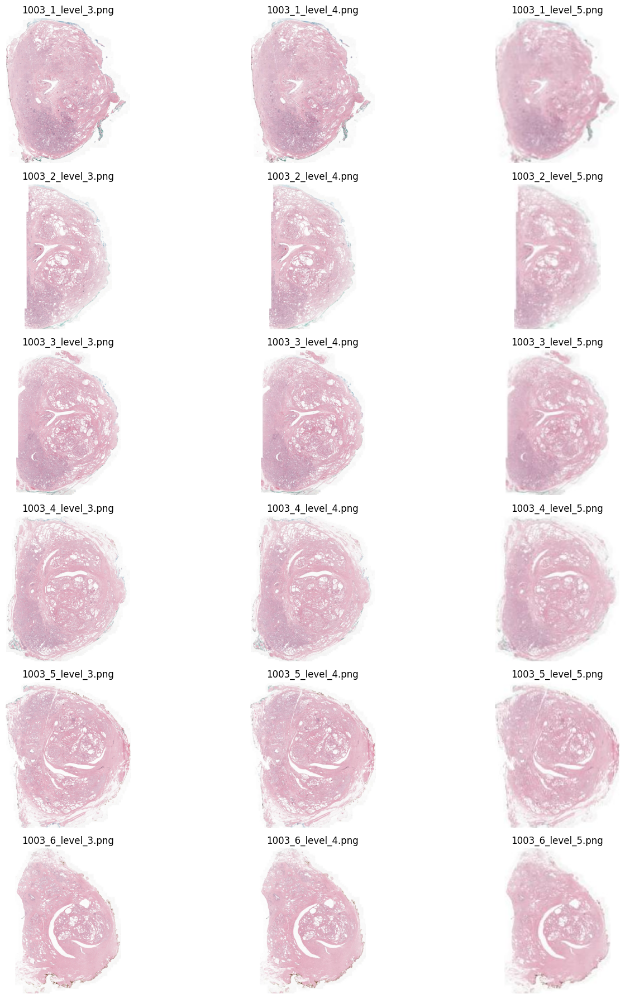

In [5]:
import os
from PIL import Image
import matplotlib.pyplot as plt
from collections import defaultdict



# Step 1: 按照前缀分组，例如 1003_1
grouped = defaultdict(list)
for path in img_list:
    filename = os.path.basename(path)
    prefix = '_'.join(filename.split('_')[:2])  # 取1003_1、1003_2之类
    grouped[prefix].append(path)

# Step 2: 绘图
num_rows = len(grouped)
fig, axes = plt.subplots(num_rows, max(len(v) for v in grouped.values()), figsize=(15, 3 * num_rows))

if num_rows == 1:
    axes = [axes]  # 保证是2D list

for row_idx, (prefix, paths) in enumerate(sorted(grouped.items())):
    paths = sorted(paths, key=lambda x: int(x.split('_level_')[-1].split('.')[0]))  # 按 level 排序
    for col_idx, img_path in enumerate(paths):
        img = Image.open(img_path)
        ax = axes[row_idx][col_idx] if num_rows > 1 else axes[col_idx]
        ax.imshow(img)
        ax.set_title(os.path.basename(img_path))
        ax.axis('off')

plt.tight_layout()
plt.show()

In [10]:
save_path

'/data04/shared/xxu/cvpr/chime/data/task1/pathology/1003/1003_1level_3.png'

In [12]:
slide_item.split('/')[-1].split('.')[0]

'1003_2'

In [ ]:
/data04/shared/xxu/cvpr/chime/data/task1_processed/pathology

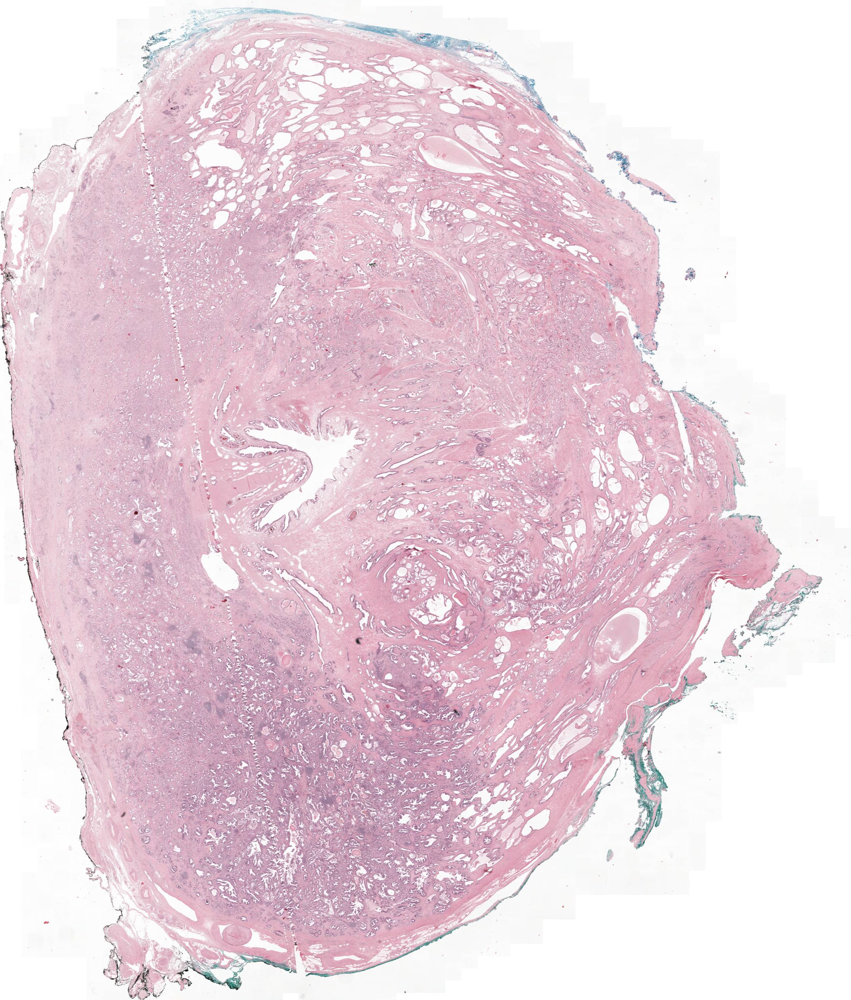

In [8]:
from PIL import Image
Image.open(save_path)

In [8]:
import SimpleITK as sitk
import numpy as np

# 读取 MHA 文件
mri_img = sitk.ReadImage('/data04/shared/xxu/cvpr/chime/data/task1/radiology/1003/1003_0001_t2w.mha')

# 转换为 numpy 数组（注意顺序是 z, y, x）
mri_np = sitk.GetArrayFromImage(mri_img)  # shape: [depth, height, width]

mri_mask = sitk.ReadImage('/data04/shared/xxu/cvpr/chime/data/task1/radiology/1003/1003_0001_mask.mha')

# 转换为 numpy 数组（注意顺序是 z, y, x）
mri_mask = sitk.GetArrayFromImage(mri_mask)  # shape: [depth, height, width]

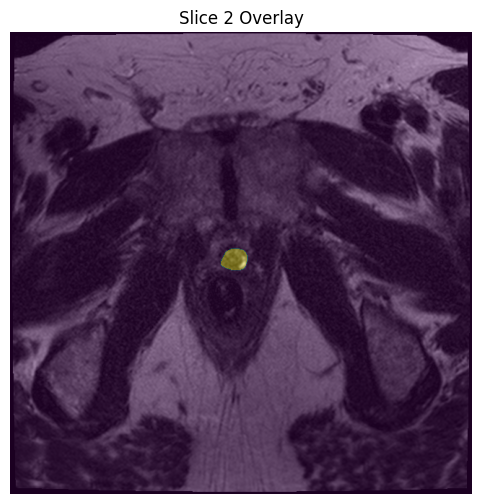

In [11]:
import matplotlib.pyplot as plt
import numpy as np

# 假设 mri_np 和 mask_np 是 shape: [depth, height, width]
def show_overlay(mri_np, mask_np, slice_index=None, alpha=0.4):
    if slice_index is None:
        slice_index = mri_np.shape[0] // 2  # 中间切片

    mri_slice = mri_np[slice_index]
    mask_slice = mask_np[slice_index]

    plt.figure(figsize=(6, 6))
    plt.imshow(mri_slice, cmap='gray')
    plt.imshow(mask_slice, alpha=alpha)  # alpha 控制透明度
    plt.title(f"Slice {slice_index} Overlay")
    plt.axis('off')
    plt.show()

# 示例调用
show_overlay(mri_np, mri_mask, slice_index=2)


In [9]:
mri_mask.shape

(19, 640, 640)

In [10]:
for i in range(mri_mask.shape[0]):
    if np.count_nonzero(mri_mask[i]>0):
        print(i)

2
3
4
5
6
7
8
9
10
11
12
13


In [11]:
from PIL import Image
img1 = Image.open('/home/xxu/cvpr/wacv/diffusion-4k/visualization/flux_wavelet/a girl_gs_5.0_2048x3072_seed_0.jpg')

In [13]:
img1.size

(3072, 2048)

In [14]:
arr1 = np.array(img1)

In [15]:
arr1.shape

(2048, 3072, 3)

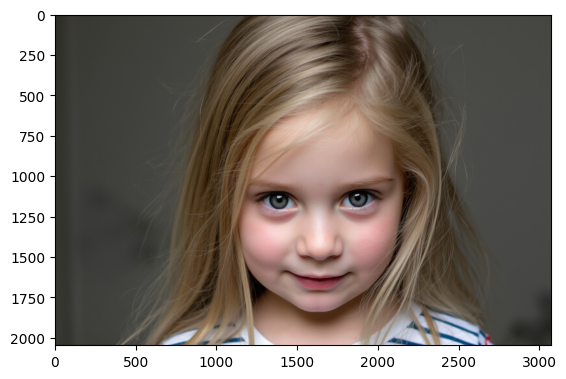

In [16]:
plt.imshow(arr1)

In [28]:
import nibabel as nib
import numpy as np

# 读取 NIfTI 文件（可以是 .nii 或 .nii.gz）
nii_path = '/data04/shared/xxu/brats18/HGG/Brats18_2013_19_1/Brats18_2013_19_1_flair.nii.gz'  # 替换为你的文件路径
img_nii = nib.load(nii_path)

# 获取 numpy 数据（float64 类型）
img_np = img_nii.get_fdata()  # shape: (H, W, D) → (Y, X, Z)
print("Image shape:", img_np.shape)

# 如果需要转换为 float32（更节省显存）
img_np = img_np.astype(np.float32)

seg_nii = nib.load('/data04/shared/xxu/brats18/HGG/Brats18_2013_19_1/Brats18_2013_19_1_seg.nii.gz')
seg_np = seg_nii.get_fdata()
print('seg shape:{}'.format(seg_np.shape))


Image shape: (240, 240, 155)
seg shape:(240, 240, 155)


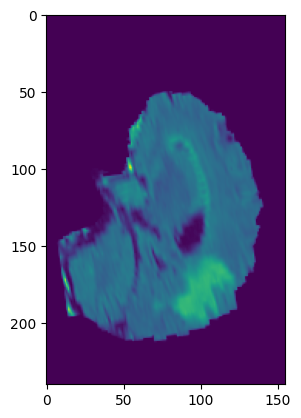

In [26]:
plt.imshow(img_np[100,:,:,])

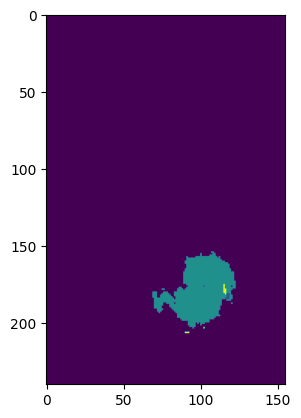

In [25]:
plt.imshow(seg_np[100])